In [5]:
# import lib

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure

# configuration of the plots
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

In [6]:
# Read the data
df = pd.read_csv("E:/folder E/python code/pythonProject/movies/movies.csv")

In [3]:
# let's look at the data
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [4]:
# let's look if there are missing data

# 1st Method
df.isnull().sum()

name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64

In [7]:
# 2nd Method
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{}-{}%'.format(col,pct_missing))

name-0.0%
rating-0.010041731872717789%
genre-0.0%
year-0.0%
released-0.0002608242044861763%
score-0.0003912363067292645%
votes-0.0003912363067292645%
director-0.0%
writer-0.0003912363067292645%
star-0.00013041210224308815%
country-0.0003912363067292645%
budget-0.2831246739697444%
gross-0.02464788732394366%
company-0.002217005738132499%
runtime-0.0005216484089723526%


In [8]:
# 3rd Method (also check the data type)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7668 entries, 0 to 7667
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      7668 non-null   object 
 1   rating    7591 non-null   object 
 2   genre     7668 non-null   object 
 3   year      7668 non-null   int64  
 4   released  7666 non-null   object 
 5   score     7665 non-null   float64
 6   votes     7665 non-null   float64
 7   director  7668 non-null   object 
 8   writer    7665 non-null   object 
 9   star      7667 non-null   object 
 10  country   7665 non-null   object 
 11  budget    5497 non-null   float64
 12  gross     7479 non-null   float64
 13  company   7651 non-null   object 
 14  runtime   7664 non-null   float64
dtypes: float64(5), int64(1), object(9)
memory usage: 898.7+ KB


In [10]:
# change data type of columns(even we have null in the data)

df['budget']=df['budget'].apply(lambda x: x if np.isnan(x) else int(x))
df['gross']=df['gross'].apply(lambda x: x if np.isnan(x) else int(x))

In [11]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [12]:
# before changeing the data type we will fill the missing data(numirical)

df['budget']=df['budget'].fillna(df['budget'].median())
df['gross']=df['gross'].fillna(df['gross'].median())
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7668 entries, 0 to 7667
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      7668 non-null   object 
 1   rating    7591 non-null   object 
 2   genre     7668 non-null   object 
 3   year      7668 non-null   int64  
 4   released  7666 non-null   object 
 5   score     7665 non-null   float64
 6   votes     7665 non-null   float64
 7   director  7668 non-null   object 
 8   writer    7665 non-null   object 
 9   star      7667 non-null   object 
 10  country   7665 non-null   object 
 11  budget    7668 non-null   float64
 12  gross     7668 non-null   float64
 13  company   7651 non-null   object 
 14  runtime   7664 non-null   float64
dtypes: float64(5), int64(1), object(9)
memory usage: 898.7+ KB


In [13]:
#we will fill the missing data(object/catgorical)

df['rating'] = df['rating'].fillna(df['rating'].mode()[0])
df['company'] = df['company'].fillna('Unknow')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7668 entries, 0 to 7667
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      7668 non-null   object 
 1   rating    7668 non-null   object 
 2   genre     7668 non-null   object 
 3   year      7668 non-null   int64  
 4   released  7666 non-null   object 
 5   score     7665 non-null   float64
 6   votes     7665 non-null   float64
 7   director  7668 non-null   object 
 8   writer    7665 non-null   object 
 9   star      7667 non-null   object 
 10  country   7665 non-null   object 
 11  budget    7668 non-null   float64
 12  gross     7668 non-null   float64
 13  company   7668 non-null   object 
 14  runtime   7664 non-null   float64
dtypes: float64(5), int64(1), object(9)
memory usage: 898.7+ KB


In [17]:
# change the data type

df['budget']=df['budget'].astype('int64')
df['gross']=df['gross'].astype('int64')

In [18]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0


In [43]:
# create new col

df['released_year']=df['released'].astype(str).str.split(',',expand=True)[1].str[:5]

In [44]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,released_year
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980


In [45]:
# To see all the rows at onces

pd.set_option('display.max_rows',None)

In [102]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,released_year,released_month,released_day
0,6587,6,6,1980,1705,8.4,927000.0,2589,4014,1047,54,19000000,46998772,2320,146.0,0,14,9
1,5573,6,1,1980,1492,5.8,65000.0,2269,1632,327,55,4500000,58853106,731,104.0,0,13,29
2,5142,4,0,1980,1771,8.7,1200000.0,1111,2567,1745,55,18000000,538375067,1540,124.0,0,14,30
3,286,4,4,1980,1492,7.7,221000.0,1301,2000,2246,55,3500000,83453539,1812,88.0,0,13,29
4,1027,6,4,1980,1543,7.3,108000.0,1054,521,410,55,6000000,39846344,1777,98.0,0,13,37


In [47]:
# To sort the data as per any column

df.sort_values(by=['gross'],inplace=False,ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,released_year
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0,2019
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0,2015
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0,2012
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0,2015
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0,2019


In [48]:
# Drop duplicates
# if you want to drop

df['company'].drop_duplicates().sort_values(ascending=False) #(used sort to view the duplicates)

# to drop duplicates from the entiere dataframe 

df.drop_duplicates()

7129                                              thefyzz
5664                                          micro_scope
6412                             iDeal Partners Film Fund
4007                                             i5 Films
6793                                           i am OTHER
6420                                                 erbp
3776                                       double A Films
524                             Zupnik-Curtis Enterprises
3330                          Zucker Brothers Productions
146                                      Zoetrope Studios
2213                                   Zeta Entertainment
6222                        Zentropa International Norway
3368                              Zentropa Entertainments
535                                  Zenith Entertainment
5180                                      Zazen Produções
3193                                          ZapPictures
1321                             Zanuck/Brown Productions
1329          

In [50]:
# to get the unique values from different columns

for col in df.columns:
    x = df[col].unique()
    print('{}-{}'.format(col,x))

name-['The Shining' 'The Blue Lagoon'
 'Star Wars: Episode V - The Empire Strikes Back' ... 'Saving Mbango'
 "It's Just Us" 'Tee em el']
rating-['R' 'PG' 'G' 'Not Rated' 'NC-17' 'Approved' 'TV-PG' 'PG-13' 'Unrated' 'X'
 'TV-MA' 'TV-14']
genre-['Drama' 'Adventure' 'Action' 'Comedy' 'Horror' 'Biography' 'Crime'
 'Fantasy' 'Family' 'Sci-Fi' 'Animation' 'Romance' 'Music' 'Western'
 'Thriller' 'History' 'Mystery' 'Sport' 'Musical']
year-[1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993
 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007
 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020]
released-['June 13, 1980 (United States)' 'July 2, 1980 (United States)'
 'June 20, 1980 (United States)' ... 'October 23, 2020 (United States)'
 'April 27, 2020 (Cameroon)' 'August 19, 2020 (United States)']
score-[8.4 5.8 8.7 7.7 7.3 6.4 7.9 8.2 6.8 7.  6.1 5.3 7.1 7.2 6.6 6.9 6.5 6.7
 5.  6.2 5.4 6.3 6.  5.9 7.5 4.8 4.6 5.1 8.3 4.2 5.5 8.1 4.7 5.2 7.

[Text(0.5, 1.0, 'Budget Vs Gross')]

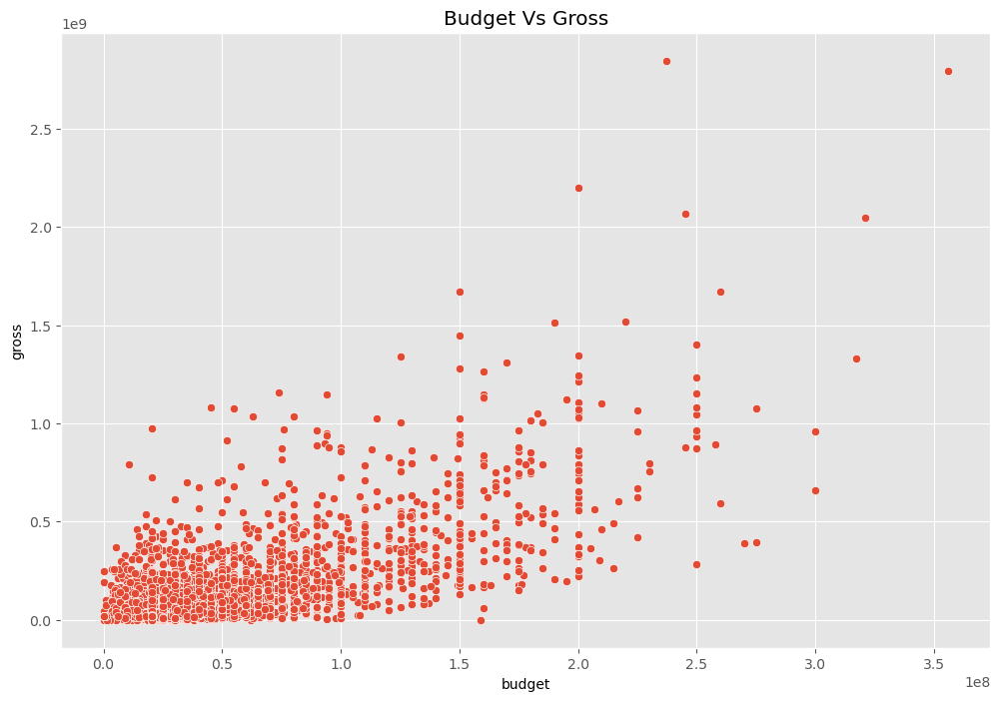

In [55]:
# Correlation
#scatter plot with budget vs gross

sns.scatterplot(data=df,x='budget',y='gross').set(title='Budget Vs Gross')

<Axes: xlabel='budget', ylabel='gross'>

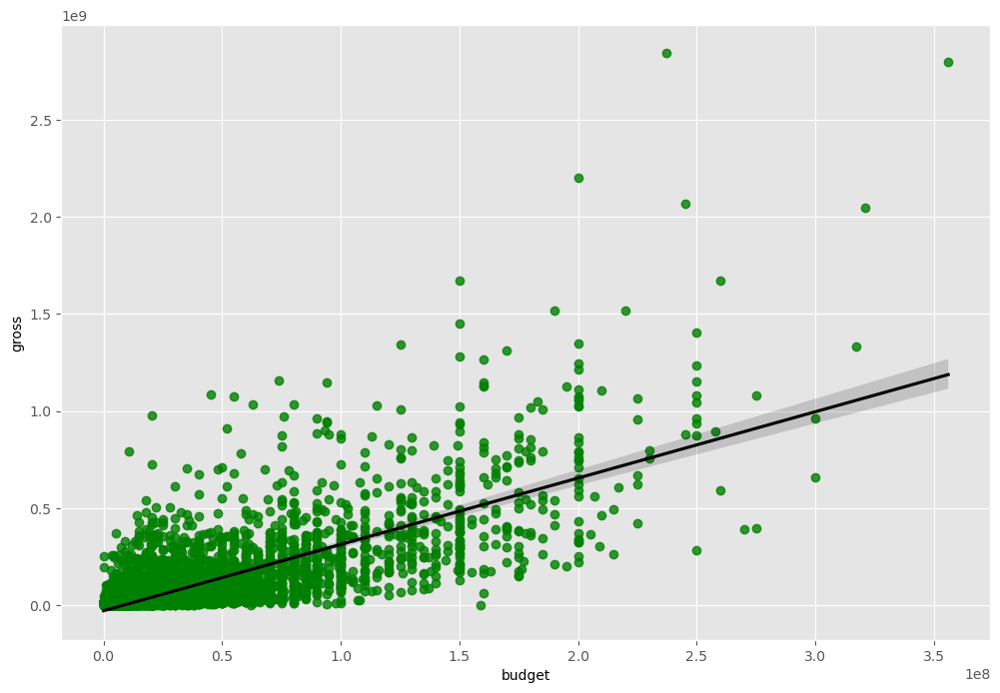

In [60]:
# Regplot

sns.regplot(data=df,x='budget',y='gross',scatter_kws={'color':'green'},line_kws={'color':'black'})

In [61]:
# let look at correlation

df.corr() # by defult it use pearson but we can also use(kendall,spearman)

C:\Users\nayak\AppData\Local\Temp\ipykernel_12960\1639183600.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,year,score,votes,budget,gross,runtime
year,1.000000,0.097995,0.222945,0.291690,0.259504,0.120811
score,0.097995,1.000000,0.409182,0.061979,0.185583,0.399451
votes,0.222945,0.409182,1.000000,0.460932,0.632103,0.309212
budget,0.291690,0.061979,0.460932,1.000000,0.745881,0.273363
gross,0.259504,0.185583,0.632103,0.745881,1.000000,0.244360
runtime,0.120811,0.399451,0.309212,0.273363,0.244360,1.000000


In [63]:
df.corr(method='kendall')

C:\Users\nayak\AppData\Local\Temp\ipykernel_12960\1723791258.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr(method='kendall')


,year,score,votes,budget,gross,runtime
year,1.000000,0.067652,0.331465,0.185818,0.196205,0.097184
score,0.067652,1.000000,0.300115,-0.001745,0.084542,0.283611
votes,0.331465,0.300115,1.000000,0.269162,0.530016,0.198240
budget,0.185818,-0.001745,0.269162,1.000000,0.376115,0.192073
gross,0.196205,0.084542,0.530016,0.376115,1.000000,0.165127
runtime,0.097184,0.283611,0.198240,0.192073,0.165127,1.000000


In [64]:
df.corr(method='spearman')

C:\Users\nayak\AppData\Local\Temp\ipykernel_12960\1222267885.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr(method='spearman')


,year,score,votes,budget,gross,runtime
year,1.000000,0.099045,0.469829,0.258703,0.287788,0.142977
score,0.099045,1.000000,0.428138,-0.002880,0.124016,0.399857
votes,0.469829,0.428138,1.000000,0.382129,0.722491,0.290159
budget,0.258703,-0.002880,0.382129,1.000000,0.520018,0.270496
gross,0.287788,0.124016,0.722491,0.520018,1.000000,0.241439
runtime,0.142977,0.399857,0.290159,0.270496,0.241439,1.000000


In [65]:
# to remove warning for the code output

# import warnings
# warnings.filterwarnings("ignore")

C:\Users\nayak\AppData\Local\Temp\ipykernel_12960\1412256563.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation = df.corr()


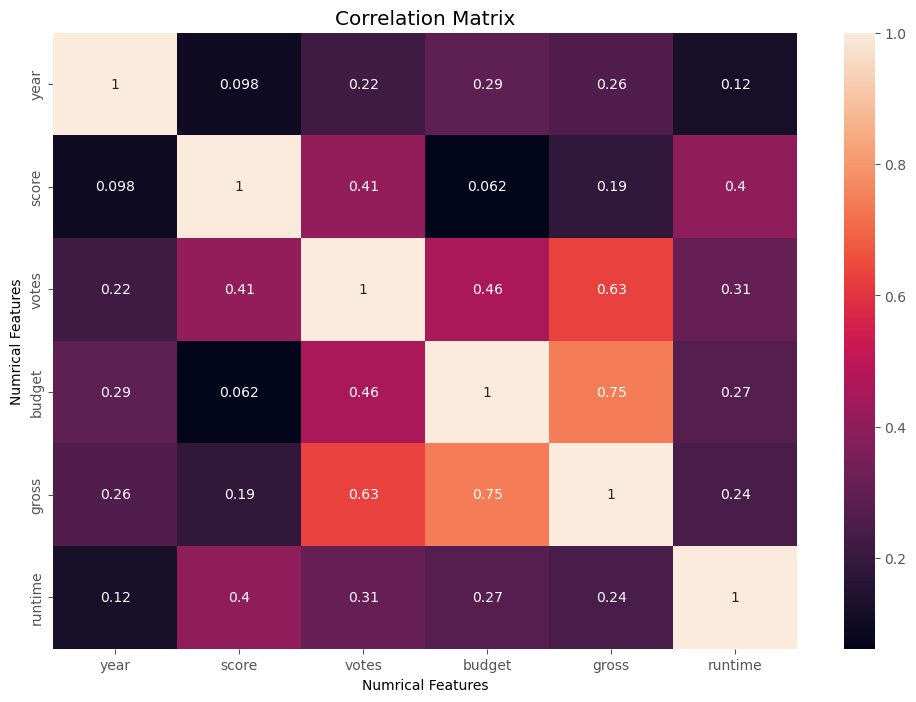

In [68]:
# To visualize correlation 
correlation = df.corr()
sns.heatmap(correlation,annot=True)
plt.title('Correlation Matrix')
plt.xlabel("Numrical Features")
plt.ylabel("Numrical Features")
plt.show()

In [89]:
# get released month

df['released_month'] = df['released'].astype(str).str.split(',',expand=True)[0].str.split(' ',expand=True)[0]
df['released_day'] = df['released'].astype(str).str.split(',',expand=True)[0].str.split(' ',expand=True)[1]

0                       June 13, 1980 (United States)
1                        July 2, 1980 (United States)
2                       June 20, 1980 (United States)
3                        July 2, 1980 (United States)
4                       July 25, 1980 (United States)
5                         May 9, 1980 (United States)
6                       June 20, 1980 (United States)
7                   December 19, 1980 (United States)
8                       June 19, 1981 (United States)
9                        May 16, 1980 (United States)
10                  December 17, 1980 (United States)
11                   October 26, 1984 (United States)
12                  December 12, 1980 (United States)
13                 September 19, 1980 (United States)
14                      July 25, 1980 (United States)
15                    October 3, 1980 (United States)
16                       May 16, 1980 (United States)
17                  December 19, 1980 (United States)
18                   Februar

In [90]:
# Now converting all the catagorical data into numirical
df_num = df
for col in df_num.columns:
    if df_num[col].dtype == 'object':
        df_num[col] = pd.Categorical(df_num[col]).codes

In [101]:
df_num.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,released_year,released_month,released_day
0,6587,6,6,1980,1705,8.4,927000.0,2589,4014,1047,54,19000000,46998772,2320,146.0,0,14,9
1,5573,6,1,1980,1492,5.8,65000.0,2269,1632,327,55,4500000,58853106,731,104.0,0,13,29
2,5142,4,0,1980,1771,8.7,1200000.0,1111,2567,1745,55,18000000,538375067,1540,124.0,0,14,30
3,286,4,4,1980,1492,7.7,221000.0,1301,2000,2246,55,3500000,83453539,1812,88.0,0,13,29
4,1027,6,4,1980,1543,7.3,108000.0,1054,521,410,55,6000000,39846344,1777,98.0,0,13,37


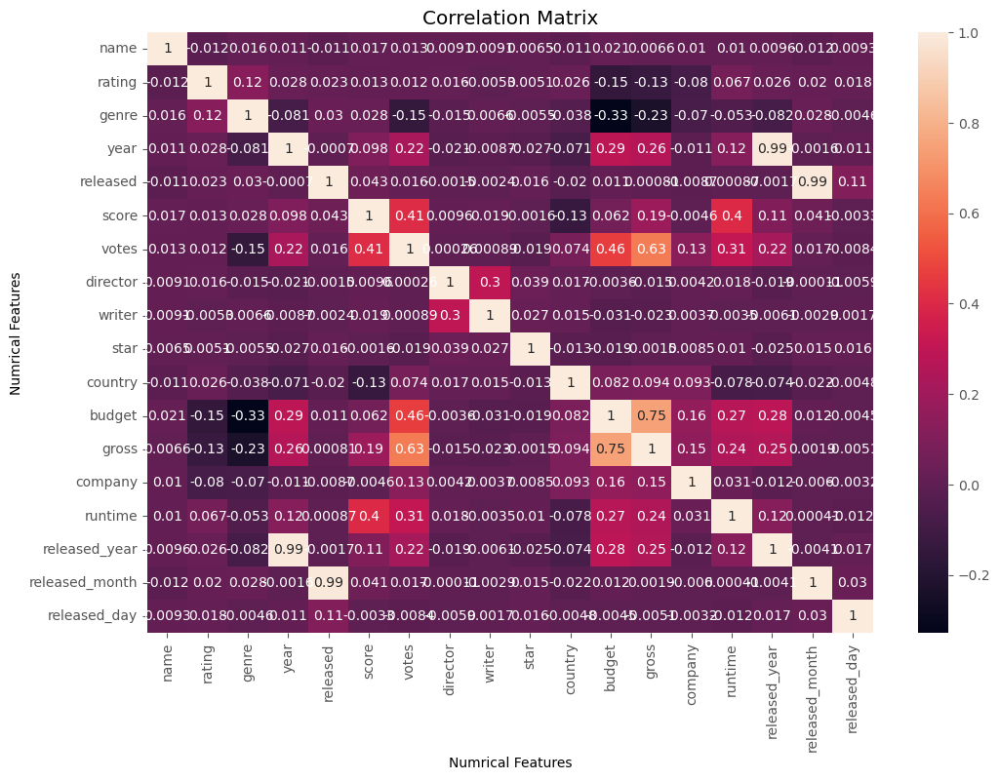

In [92]:
# now look for the correlation of all data in the dataframe

correlation = df_num.corr()
sns.heatmap(correlation,annot=True)
plt.title('Correlation Matrix')
plt.xlabel("Numrical Features")
plt.ylabel("Numrical Features")
plt.show()

In [93]:
# look into more deepth
correlation_matrix = df_num.corr()
corr_pairs = correlation_matrix.unstack()
sort_pairs = corr_pairs.sort_values()

In [94]:
sort_pairs

budget          genre            -0.328484
genre           budget           -0.328484
                gross            -0.233385
gross           genre            -0.233385
rating          budget           -0.148543
budget          rating           -0.148543
votes           genre            -0.145307
genre           votes            -0.145307
score           country          -0.133348
country         score            -0.133348
rating          gross            -0.130478
gross           rating           -0.130478
genre           released_year    -0.082070
released_year   genre            -0.082070
genre           year             -0.081261
year            genre            -0.081261
company         rating           -0.079660
rating          company          -0.079660
runtime         country          -0.078412
country         runtime          -0.078412
released_year   country          -0.074166
country         released_year    -0.074166
                year             -0.070938
year       

In [100]:
# Looking only  for high correlation

high_corr = sort_pairs[(sort_pairs)>0.5]
high_corr

votes           gross             0.632103
gross           votes             0.632103
budget          gross             0.745881
gross           budget            0.745881
released_year   year              0.992136
year            released_year     0.992136
released_month  released          0.993694
released        released_month    0.993694
name            name              1.000000
released_year   released_year     1.000000
rating          rating            1.000000
genre           genre             1.000000
year            year              1.000000
released        released          1.000000
score           score             1.000000
votes           votes             1.000000
released_month  released_month    1.000000
director        director          1.000000
star            star              1.000000
country         country           1.000000
budget          budget            1.000000
gross           gross             1.000000
company         company           1.000000
runtime    